### This notebook presents the results of using various detection models for the recognition of cultivated plants and weeds. The study includes a comparison of the performance of three models: Faster R-CNN with ResNet50 FPN architecture (fasterrcnn_resnet50_fpn_v2), SSD300 with VGG16 base network (ssd300_vgg) and YOLO version 11 large (yolo11l). Each model was evaluated using the average accuracy metric (mAP), which made it possible to identify the most effective solution for the task of detecting objects in agricultural conditions.

## 1. Faster R-CNN with ResNet50 FPN 

In [1]:
"""
This script is for handling a custom dataset for crop and weed detection.
It includes loading the dataset, splitting it into training and testing sets,
and creating data loaders.
"""
import numpy as np
import torch
import os
from torch.utils.data import Dataset, DataLoader, random_split
from torchvision import transforms
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection import fasterrcnn_resnet50_fpn_v2, ssd300_vgg16
from torchvision.transforms import functional as F
from PIL import Image
from tqdm import tqdm
from PIL import ImageDraw
import matplotlib.pyplot as plt
import cv2

import warnings
warnings.filterwarnings("ignore")

class CropWeedDataset(Dataset):
    """
    Custom dataset class for crop and weed detection.

    Args:
        root_dir (str): The root directory containing image and annotation files.
        transform (callable, optional): A function/transform that takes in an image
            and returns a transformed version.
    """
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.classes = {'crop': 1, 'weed': 2}  
        self.files = [f for f in os.listdir(root_dir) if f.endswith('.txt')]
        self.img_files = [f[:-4] + '.jpeg' for f in self.files]

    def __len__(self):
        """
        Returns the length of the dataset.

        Returns:
            int: The number of samples in the dataset.
        """
        return len(self.files)

    def __getitem__(self, idx):
        """
        Retrieves a single sample from the dataset.

        Args:
            idx (int): The index of the sample to retrieve.

        Returns:
            tuple: A tuple containing the image and associated annotations.
        """
        img_file = os.path.join(self.root_dir, self.img_files[idx])
        annotation_file = os.path.join(self.root_dir, self.files[idx])
        image = Image.open(img_file).convert("RGB")
        boxes, labels = self.parse_annotation(annotation_file, 512)

        if self.transform:
            image = self.transform(image)

        return image, {"boxes": boxes, "labels": labels}

    def parse_annotation(self, annotation_path, img_size):
        """
        Parses an annotation file to extract bounding boxes and labels.

        Args:
            annotation_path (str): The path to the annotation file.
            img_size (int): The size of the image.

        Returns:
            tuple: A tuple containing tensors of bounding boxes and labels.
        """
        with open(annotation_path, 'r') as f:
            lines = f.readlines()
            boxes = []
            labels = []
            for line in lines:
                data = line.strip().split()
                label_id = int(data[0]) + 1  # +1 because background is 0
                convert_function = lambda x: int(float(x) * img_size)
                x_center, y_center, width, height = map(convert_function, data[1:])

                xmin = x_center - width / 2
                ymin = y_center - height / 2
                xmax = x_center + width / 2
                ymax = y_center + height / 2
                boxes.append([xmin, ymin, xmax, ymax])
                labels.append(label_id)
        return torch.as_tensor(boxes, dtype=torch.float32), torch.as_tensor(labels, dtype=torch.int64)


def collate_fn(batch):
    """
    Collate function to wrap data to match the shape.

    Args:
        batch (list): A list of tuples containing image and annotations.

    Returns:
        tuple: A tuple of zipped elements from the batch.
    """
    return tuple(zip(*batch))


transform = transforms.Compose([
    transforms.ToTensor(),
])
dataset = CropWeedDataset("CropAndWeed_Dataset/agri_data/data/",
                          transform=transform)

# Split as training set and eval set
train_ratio = 0.8
train_len = int(len(dataset)*train_ratio)
test_len = int(len(dataset)) - train_len
dataset_train, dataset_test = random_split(dataset, [train_len, test_len])

BATCH_SIZE = 16

train_set = DataLoader(dataset_train, BATCH_SIZE, shuffle=True, collate_fn=collate_fn)
test_set = DataLoader(dataset_test, BATCH_SIZE, shuffle=False, collate_fn=collate_fn)

In [2]:
# test dataload & parse annotation
# This loop iterates through the training set data loader.
# It retrieves the first batch of images and annotations and then breaks.
for imgs, annotations in train_set:
    # Prints the first image in the batch.
    print(imgs[0])
    # Prints the annotations associated with the batch.
    print(f"annotation: {annotations}")
    break

tensor([[[0.6941, 0.7020, 0.7098,  ..., 0.5333, 0.5373, 0.5412],
         [0.6824, 0.7255, 0.7451,  ..., 0.5333, 0.5373, 0.5373],
         [0.6784, 0.7216, 0.7373,  ..., 0.5294, 0.5333, 0.5373],
         ...,
         [0.4588, 0.4275, 0.4157,  ..., 0.3922, 0.4902, 0.3922],
         [0.4667, 0.4431, 0.4431,  ..., 0.3843, 0.4863, 0.3882],
         [0.4667, 0.4235, 0.4000,  ..., 0.3686, 0.4784, 0.3961]],

        [[0.6784, 0.6863, 0.6941,  ..., 0.7373, 0.7412, 0.7451],
         [0.6667, 0.7098, 0.7294,  ..., 0.7373, 0.7412, 0.7412],
         [0.6627, 0.7059, 0.7216,  ..., 0.7333, 0.7373, 0.7412],
         ...,
         [0.4235, 0.3922, 0.3804,  ..., 0.3373, 0.4353, 0.3373],
         [0.4314, 0.4078, 0.4078,  ..., 0.3294, 0.4235, 0.3255],
         [0.4314, 0.3882, 0.3647,  ..., 0.3137, 0.4157, 0.3333]],

        [[0.6745, 0.6824, 0.6902,  ..., 0.5490, 0.5529, 0.5569],
         [0.6627, 0.7059, 0.7255,  ..., 0.5490, 0.5529, 0.5529],
         [0.6588, 0.7020, 0.7176,  ..., 0.5451, 0.5569, 0.

In [3]:
class EarlyStopping:
    """Early stops the training if validation loss doesn't improve after a given patience."""

    def __init__(self, patience=5, verbose=False, delta=0):
        """Initialize early stopping parameters.

        Args:
            patience (int): How long to wait after last time validation loss improved.
                            Default: 5
            verbose (bool): If True, prints a message for each validation loss improvement.
                            Default: False
            delta (float): Minimum change in the monitored quantity to qualify as an improvement.
                            Default: 0
        """
        self.patience = patience
        self.verbose = verbose
        self.counter = 0
        self.best_score = None
        self.early_stop = False
        self.val_loss_min = np.inf
        self.delta = delta

    def __call__(self, val_loss, model):
        """Checks if the validation loss has improved and updates the early stopping state.

        Args:
            val_loss (float): Validation loss.
            model (torch.nn.Module): Model to save.
        """
        score = -val_loss

        if self.best_score is None:
            self.best_score = score
            self.save_checkpoint(val_loss, model)
        elif score < self.best_score + self.delta:
            self.counter += 1
            print(f'EarlyStopping counter: {self.counter} out of {self.patience}')
            if self.counter >= self.patience:
                self.early_stop = True
        else:
            self.best_score = score
            self.save_checkpoint(val_loss, model)
            self.counter = 0

    def save_checkpoint(self, val_loss, model):
        """Saves model when validation loss decreases.

        Args:
            val_loss (float): Validation loss.
            model (torch.nn.Module): Model to save.
        """
        if self.verbose:
            print(f'Validation loss decreased ({self.val_loss_min:.6f} --> {val_loss:.6f}). Saving model...')
        torch.save(model.state_dict(), 'checkpoint.pt')
        self.val_loss_min = val_loss

In [4]:
def get_model(num_classes):
    """Create a Faster R-CNN model with ResNet50 FPN backbone.

    Args:
        num_classes (int): Number of classes including background.

    Returns:
        model (torch.nn.Module): Faster R-CNN model.
    """
    model = fasterrcnn_resnet50_fpn_v2(pretrained=True)
    in_features = model.roi_heads.box_predictor.cls_score.in_features
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)
    return model


def train_one_epoch(model, dataloader, optimizer, device):
    """Train the model for one epoch.

    Args:
        model (torch.nn.Module): Model to train.
        dataloader (DataLoader): Dataloader for the training dataset.
        optimizer (torch.optim.Optimizer): Optimizer for updating model weights.
        device (torch.device): Device to perform computations on.

    Returns:
        float: Average training loss for the epoch.
    """
    model.train()
    epoch_losses = 0.0
    for images, targets in dataloader:
        # Load images and annotations to GPU
        images = [image.to(device) for image in images]
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

        # Calculate loss
        loss_dict = model(images, targets)
        losses = sum(loss for loss in loss_dict.values())
        epoch_losses += losses.item()

        # Zero gradients, backward pass, and update weights
        optimizer.zero_grad()
        losses.backward()
        optimizer.step()

        # Remove cache from GPU
        del images, targets, losses
        torch.cuda.empty_cache()

    return epoch_losses / len(dataloader)


def evaluate(model, dataloader, device):
    """Evaluate the model on a dataset.

    Args:
        model (torch.nn.Module): Model to evaluate.
        dataloader (DataLoader): Dataloader for the evaluation dataset.
        device (torch.device): Device to perform computations on.

    Returns:
        float: Average evaluation loss.
    """
    total_loss = 0.0
    with torch.no_grad():
        for images, targets in dataloader:
            images = [image.to(device) for image in images]
            targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

            # Calculate loss
            loss_dict = model(images, targets)
            total_loss += sum(loss for loss in loss_dict.values()).item()

    return total_loss / len(dataloader)



device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

# Define number of classes (+1 for background)
num_classes = len(dataset.classes) + 1
model = get_model(num_classes)
model.to(device)

# Define optimizer
optimizer = torch.optim.SGD(model.parameters(), lr=0.0005, momentum=0.9, weight_decay=0.0005)
num_epochs = 50

# Initialize Early Stopping
early_stopping = EarlyStopping(patience=3, verbose=True)

epoch_train_losses = []
epoch_eval_losses = []

# Training loop
for epoch in tqdm(range(num_epochs)):
    e_loss = train_one_epoch(model, train_set, optimizer, device)
    epoch_train_losses.append(e_loss)
    print(f"Epoch {epoch+1}/{num_epochs}, train loss: {e_loss:.4f}")

    val_loss = evaluate(model, test_set, device)
    epoch_eval_losses.append(val_loss)

    early_stopping(val_loss, model)

    if early_stopping.early_stop:
        print("Early stopping")
        break

print("Training complete.")

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 1/50, train loss: 0.4399


  2%|▏         | 1/50 [01:12<59:07, 72.39s/it]

Validation loss decreased (inf --> 0.343946). Saving model...
Epoch 2/50, train loss: 0.3069


  4%|▍         | 2/50 [02:23<57:30, 71.89s/it]

Validation loss decreased (0.343946 --> 0.325984). Saving model...
Epoch 3/50, train loss: 0.2893


  6%|▌         | 3/50 [03:33<55:36, 71.00s/it]

Validation loss decreased (0.325984 --> 0.305719). Saving model...
Epoch 4/50, train loss: 0.2677


  8%|▊         | 4/50 [04:43<54:03, 70.52s/it]

Validation loss decreased (0.305719 --> 0.281796). Saving model...
Epoch 5/50, train loss: 0.2421


 10%|█         | 5/50 [05:53<52:41, 70.27s/it]

Validation loss decreased (0.281796 --> 0.256661). Saving model...
Epoch 6/50, train loss: 0.2143


 12%|█▏        | 6/50 [07:03<51:26, 70.15s/it]

Validation loss decreased (0.256661 --> 0.233137). Saving model...
Epoch 7/50, train loss: 0.1914


 14%|█▍        | 7/50 [08:12<50:05, 69.89s/it]

Validation loss decreased (0.233137 --> 0.213466). Saving model...
Epoch 8/50, train loss: 0.1722


 16%|█▌        | 8/50 [09:22<48:48, 69.72s/it]

Validation loss decreased (0.213466 --> 0.200095). Saving model...
Epoch 9/50, train loss: 0.1584


 18%|█▊        | 9/50 [10:32<47:41, 69.78s/it]

Validation loss decreased (0.200095 --> 0.190153). Saving model...
Epoch 10/50, train loss: 0.1494


 20%|██        | 10/50 [11:41<46:26, 69.65s/it]

Validation loss decreased (0.190153 --> 0.183862). Saving model...
Epoch 11/50, train loss: 0.1412


 22%|██▏       | 11/50 [12:51<45:16, 69.66s/it]

Validation loss decreased (0.183862 --> 0.178641). Saving model...
Epoch 12/50, train loss: 0.1333


 24%|██▍       | 12/50 [14:00<44:04, 69.60s/it]

Validation loss decreased (0.178641 --> 0.175763). Saving model...
Epoch 13/50, train loss: 0.1265


 26%|██▌       | 13/50 [15:10<42:54, 69.57s/it]

Validation loss decreased (0.175763 --> 0.172436). Saving model...
Epoch 14/50, train loss: 0.1195


 28%|██▊       | 14/50 [16:19<41:45, 69.61s/it]

Validation loss decreased (0.172436 --> 0.170760). Saving model...
Epoch 15/50, train loss: 0.1154


 30%|███       | 15/50 [17:29<40:37, 69.66s/it]

Validation loss decreased (0.170760 --> 0.169646). Saving model...
Epoch 16/50, train loss: 0.1103


 32%|███▏      | 16/50 [18:39<39:29, 69.69s/it]

Validation loss decreased (0.169646 --> 0.168234). Saving model...
Epoch 17/50, train loss: 0.1062


 34%|███▍      | 17/50 [19:48<38:15, 69.57s/it]

EarlyStopping counter: 1 out of 3
Epoch 18/50, train loss: 0.1044


 36%|███▌      | 18/50 [20:57<37:03, 69.49s/it]

Validation loss decreased (0.168234 --> 0.167834). Saving model...
Epoch 19/50, train loss: 0.1007


 38%|███▊      | 19/50 [22:07<35:54, 69.49s/it]

Validation loss decreased (0.167834 --> 0.166561). Saving model...
Epoch 20/50, train loss: 0.0972


 40%|████      | 20/50 [23:17<34:47, 69.59s/it]

Validation loss decreased (0.166561 --> 0.166076). Saving model...
Epoch 21/50, train loss: 0.0939


 42%|████▏     | 21/50 [24:26<33:40, 69.66s/it]

EarlyStopping counter: 1 out of 3
Epoch 22/50, train loss: 0.0902


 44%|████▍     | 22/50 [25:36<32:27, 69.54s/it]

EarlyStopping counter: 2 out of 3
Epoch 23/50, train loss: 0.0886


 44%|████▍     | 22/50 [26:45<34:03, 72.97s/it]

EarlyStopping counter: 3 out of 3
Early stopping
Training complete.


Plotting images: Ground truth bboxes are in green.


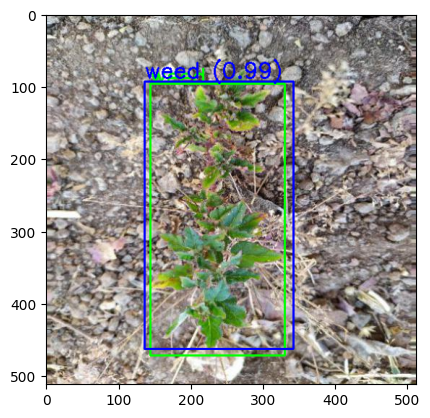

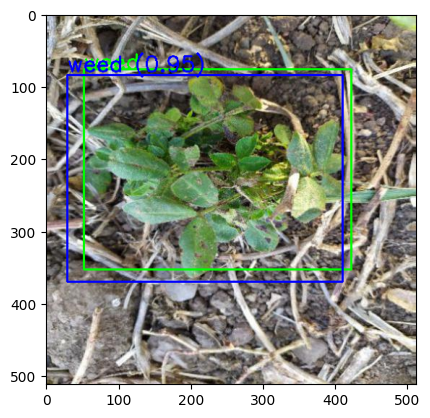

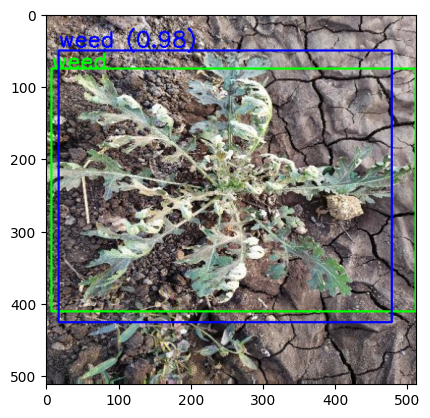

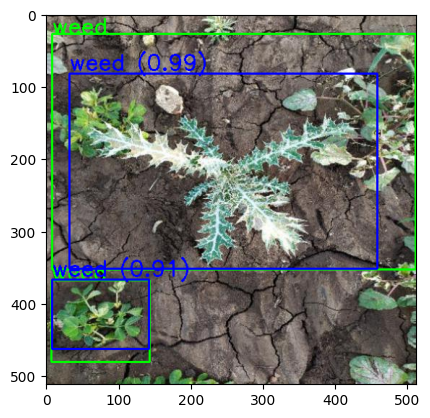

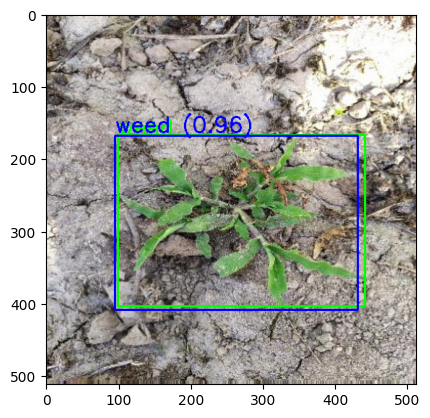

...

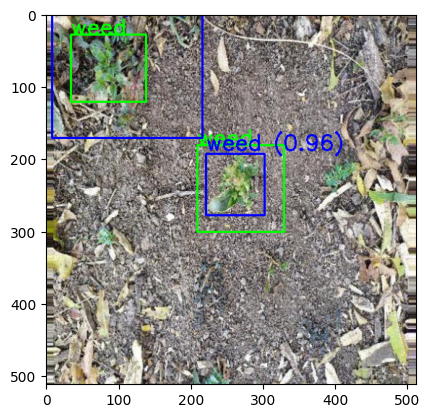

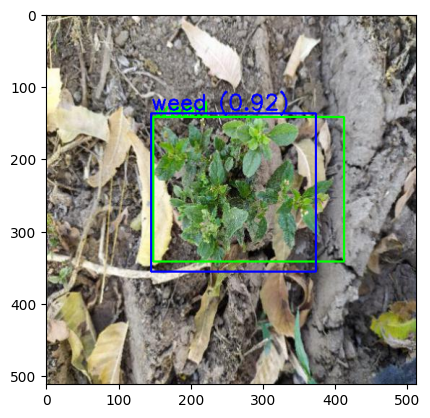

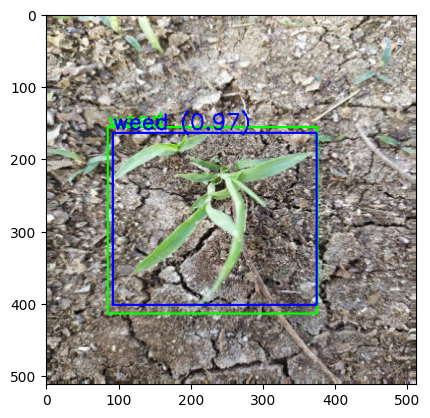

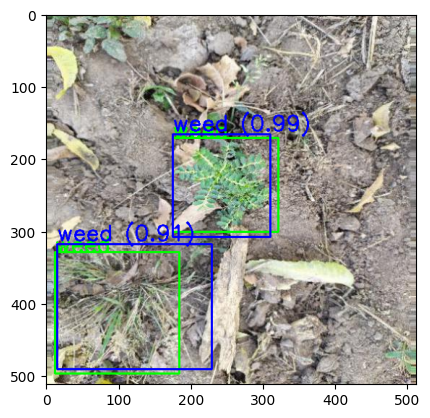

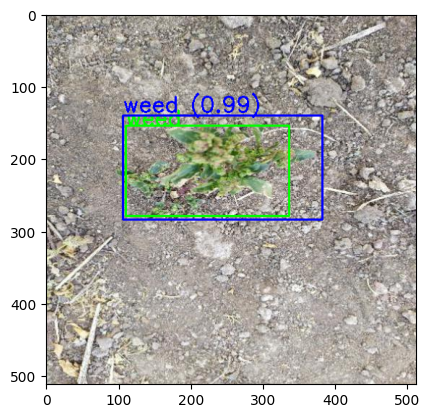

In [5]:
model.eval()

print(f"Plotting images: Ground truth bboxes are in green.")

# Randomly pick an image from eval set
for images, targets in test_set:
    for j, img_tensor in enumerate(images):
        img_tensor = img_tensor.to(device)
        img_target = targets[j]
        prediction = model([img_tensor])[0]

        # Convert tensor to numpy array and reshape for OpenCV and Matplotlib
        img_numpy = (img_tensor.cpu().numpy() * 255).astype(np.uint8).transpose(1, 2, 0)

        # Convert color space if needed (OpenCV uses BGR by default)
        img_bgr = cv2.cvtColor(img_numpy, cv2.COLOR_RGB2BGR)

        # Plot with Matplotlib using OpenCV image
        plt.figure()

        for i, gt_box in enumerate(img_target['boxes'].numpy()):
            gt_label = img_target['labels'].numpy()[i]
            xmin, ymin, xmax, ymax = gt_box
            cv2.rectangle(img_bgr, (int(xmin), int(ymin)), (int(xmax), int(ymax)), (0, 255, 0), 2)
            cv2.putText(img_bgr, str(f"{'crop' if gt_label.item() == 1 else 'weed'}"), (int(xmin), int(ymin)), cv2.FONT_HERSHEY_SIMPLEX, 1,
                        (0, 255, 0), 2)

        boxes = prediction['boxes']
        labels = prediction['labels']
        scores = prediction['scores']

        # filter bbox with confidence = 0.5
        valid_indices = scores > 0.5
        valid_boxes = boxes[valid_indices]
        valid_labels = labels[valid_indices]
        valid_scores = scores[valid_indices]
        for box, label, score in zip(valid_boxes, valid_labels, valid_scores):
            xmin, ymin, xmax, ymax = box

             # Draw bounding box
            cv2.rectangle(img_bgr, (int(xmin), int(ymin)), (int(xmax), int(ymax)), (255, 0, 0), 2)
            
            # Add label and score to the bounding box
            #label_text = f"{label.item()} ({score.item():.2f})"  # Format score to 2 decimal places
            label_text = f"{'crop' if label.item() == 1 else 'weed'} ({score.item():.2f})"
            
            cv2.putText(img_bgr, label_text, (int(xmin), int(ymin) - 5), cv2.FONT_HERSHEY_SIMPLEX, 1,
                        (255, 0, 0), 2)

                    
        

        plt.imshow(cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB))
        plt.show()
    break

### Consturct AP for calculate mAP50

In [6]:
# function for intersection
def find_intersection(set_1, set_2):
    lower_bounds = torch.max(set_1[:, :2].unsqueeze(1), set_2[:, :2].unsqueeze(0))
    upper_bounds = torch.min(set_1[:, 2:].unsqueeze(1), set_2[:, 2:].unsqueeze(0))
    intersection_dims = torch.clamp(upper_bounds - lower_bounds, min=0)
    return intersection_dims[:, :, 0] * intersection_dims[:, :, 1]

# function for IoU
def find_jaccard_overlap(set_1, set_2):
    intersection = find_intersection(set_1, set_2)
    areas_set_1 = (set_1[:, 2] - set_1[:, 0]) * (set_1[:, 3] - set_1[:, 1])
    areas_set_2 = (set_2[:, 2] - set_2[:, 0]) * (set_2[:, 3] - set_2[:, 1])

    union = areas_set_1.unsqueeze(1) + areas_set_2.unsqueeze(0) - intersection
    return intersection / union

In [7]:
def calculate_AP(det_boxes, det_scores, true_boxes, iou_threshold):
    """
    Calculate the Average Precision (AP) of detected objects of one class.

    :param det_boxes: list of tensors, one tensor for each image containing detected objects' bounding boxes
    :param det_scores: list of tensors, one tensor for each image containing detected objects' labels' scores
    :param true_boxes: list of tensors, one tensor for each image containing actual objects' bounding boxes
    :return: average precision (AP)
    """

    # Create flattened lists for ground truth
    true_images = []
    for i in range(len(true_boxes)):
        true_images.extend([i] * true_boxes[i].size(0))

    true_images = torch.LongTensor(true_images)  # (n_objects), where n_objects is the number of all ground truths across all images
    true_boxes = torch.cat(true_boxes, dim=0)  # (n_objects, 4)
    n_objects = true_boxes.size(0)

    # We will mark which of the ground truths we managed to detect (i.e., match with detections)
    # None matched initially
    true_class_boxes_detected = torch.zeros(n_objects, dtype=torch.uint8)  # (n_class_objects)

    # Create flattened lists for detections
    det_images = list()
    for i in range(len(det_boxes)):
        det_images.extend([i] * det_boxes[i].size(0))

    det_images = torch.LongTensor(det_images)  # (n_detections)
    det_boxes = torch.cat(det_boxes, dim=0)  # (n_detections, 4)
    det_scores = torch.cat(det_scores, dim=0)  # (n_detections)

    n_detections = det_boxes.size(0)
    if n_detections == 0:
        return 0

    # Sort detections in descending order of score
    det_scores, sort_ind = torch.sort(det_scores, dim=0, descending=True)  # (n_detections)
    det_images = det_images[sort_ind]  # (n_detections)
    det_boxes = det_boxes[sort_ind]  # (n_detections, 4)

    # Iterate through the sorted list of boxes and check which ones are TP or FP
    true_positives = torch.zeros((n_detections), dtype=torch.float)  # (n_detections)
    false_positives = torch.zeros((n_detections), dtype=torch.float)  # (n_detections)
    for d in range(n_detections):  # Take each detection, check overlaps with ground truths, and determine FP/TP
        this_detection_box = det_boxes[d].unsqueeze(0)  # (1, 4)
        this_image = det_images[d]  # (), scalar # image index

        # Select the necessary ground truths for this image
        object_boxes = true_boxes[true_images == this_image]  # (n_objects_in_img)

        # If there are no ground truths, it's an FP
        if object_boxes.size(0) == 0:
            false_positives[d] = 1
            continue

        # Compute overlaps with all ground truths and find the maximum overlap
        overlaps = find_jaccard_overlap(this_detection_box, object_boxes)  # (1, n_objects_in_img)
        max_overlap, ind = torch.max(overlaps.squeeze(0), dim=0)  # (), () - scalars

        # Find the original index of the object to properly reference the true_boxes_detected matrix
        original_ind = torch.LongTensor(range(true_boxes.size(0)))[true_images == this_image][ind]

        # If max_overlap > threshold and the ground truth is free, match it, and it's a TP
        if max_overlap.item() > iou_threshold:
          if true_class_boxes_detected[original_ind] == 0:
            true_positives[d] = 1
            true_class_boxes_detected[original_ind] = 1  # This ground truth is now taken, no other detections can match it; indexes of true_cl_boxes_detec correspond to true_boxes indexes
          else:
            false_positives[d] = 1  # Since we sorted by score, the highest-scoring detection is already matched, so if ground truth is taken, it's an FP
        # Otherwise, sorry, it's a miss
        else:
            false_positives[d] = 1

    # Calculate cumulative TP/FP in descending score order
    cumul_true_positives = torch.cumsum(true_positives, dim=0)  # (n_detections)
    cumul_false_positives = torch.cumsum(false_positives, dim=0)  # (n_detections)

    # Now compute cumulative precision/recall in descending score order
    cumul_precision = cumul_true_positives / (cumul_true_positives + cumul_false_positives + 1e-10)  # (n_detections)
    cumul_recall = cumul_true_positives / true_images.size(0)  # (n_detections)

    # Perform interpolation to make the function monotonically decreasing, creating bins
    # The average height across all bins will give us average precision
    recall_thresholds = torch.arange(start=0, end=1.01, step=.01).tolist()
    precisions = torch.zeros((len(recall_thresholds)), dtype=torch.float)

    for i, t in enumerate(recall_thresholds):
        recalls_above_t = cumul_recall >= t
        if recalls_above_t.any():
            precisions[i] = cumul_precision[recalls_above_t].max()
            #print(precisions[i])
        else:
            precisions[i] = 0.
            #print(precisions[i])

    return precisions.mean().item()


### Calculate mAP50 for R-CNN with ResNet50 FPN

In [8]:
predictions = []
ground_truths = []

for images, targets in test_set:
    # Transfer images and tags to the device
    images = [img_tensor.to(device) for img_tensor in images]
    targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

    with torch.no_grad():
        for j, img_tensor in enumerate(images):
            img_target = targets[j]
            prediction = model([img_tensor])[0]

            # Save predictions
            predictions.append({
                'boxes': prediction['boxes'],
                'labels': prediction['labels'],
                'scores': prediction['scores']
            })

            # Save ground truth 
            ground_truths.append({
                'boxes': img_target['boxes'],
                'labels': img_target['labels']
            })


In [9]:
#Calculate mAP50
iou_threshold = 0.5
all_classes = torch.unique(predictions[0]['labels']).cpu()  
mAP = 0

# Transfer tensors of predictions to cpu
predicts = [
    {
        'boxes': pred['boxes'].detach().cpu(),
        'labels': pred['labels'].detach().cpu(),
        'scores': pred['scores'].detach().cpu()
    }
    for pred in predictions
]
grd_ts = [
    {
        'boxes': gt['boxes'].detach().cpu(),
        'labels': gt['labels'].detach().cpu()
    }
    for gt in ground_truths
]



for cls in all_classes:
    det_box = [pred['boxes'][pred['labels'] == cls] for pred in predicts]
    det_scor = [pred['scores'][pred['labels'] == cls] for pred in predicts]
    true_box = [gt['boxes'][gt['labels'] == cls] for gt in grd_ts]
    
    AP = calculate_AP(det_box, det_scor, true_box, iou_threshold=0.5)
    mAP += AP

mAP /= len(all_classes)  # mean AP on all classes

In [10]:
map_models = {} # dict for mAPs
map_models['fasterrcnn_resnet50_fpn_v2'] = mAP
print(mAP)

0.8214331865310669


### 2. SSD300 VGG16

In [11]:
from torchvision.models.detection.ssd import SSDClassificationHead
from torchvision.models.detection import _utils
from torchvision.models.detection import SSD300_VGG16_Weights

#for ssd300 create function to getting model
def get_model_ssd(num_classes):
    """Create an SSD300 model with VGG16 backbone.

    Args:
        num_classes (int): Number of classes including background.

    Returns:
        model (torch.nn.Module): SSD300 model.
    """
    model = ssd300_vgg16(weights=SSD300_VGG16_Weights.COCO_V1)
    
    #in_channels = model.head.classification_head.module_list[0].in_channels  
    in_channels = _utils.retrieve_out_channels(model.backbone, (512, 512))
    # List containing number of anchors based on aspect ratios.
    num_anchors = model.anchor_generator.num_anchors_per_location()
    # The classification head.
    model.head.classification_head = SSDClassificationHead(
        in_channels=in_channels,
        num_anchors=num_anchors,
        num_classes=num_classes,
    )

    # Image size for transforms.
    model.transform.min_size = (512,)
    model.transform.max_size = 512
    
    return model

In [12]:

# Define number of classes (+1 for background)
num_classes = len(dataset.classes) + 1
model_ssd = get_model_ssd(num_classes)
model_ssd.to(device)

# Define optimizer
optimizer = torch.optim.SGD(model_ssd.parameters(), lr=0.0005, momentum=0.9, weight_decay=0.0005)
num_epochs = 50

# Initialize Early Stopping
early_stopping = EarlyStopping(patience=3, verbose=True)

epoch_train_losses = []
epoch_eval_losses = []

# Training loop
for epoch in tqdm(range(num_epochs)):
    e_loss = train_one_epoch(model_ssd, train_set, optimizer, device)
    epoch_train_losses.append(e_loss)
    print(f"Epoch {epoch+1}/{num_epochs}, train loss: {e_loss:.4f}")

    val_loss = evaluate(model_ssd, test_set, device)
    epoch_eval_losses.append(val_loss)

    early_stopping(val_loss, model_ssd)

    if early_stopping.early_stop:
        print("Early stopping")
        break

print("Training complete.")

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 1/50, train loss: 5.3936


  2%|▏         | 1/50 [00:11<09:04, 11.11s/it]

Validation loss decreased (inf --> 3.623614). Saving model...
Epoch 2/50, train loss: 2.9547


  4%|▍         | 2/50 [00:21<08:45, 10.94s/it]

Validation loss decreased (3.623614 --> 2.731116). Saving model...
Epoch 3/50, train loss: 2.3745


  6%|▌         | 3/50 [00:32<08:33, 10.94s/it]

Validation loss decreased (2.731116 --> 2.406833). Saving model...
Epoch 4/50, train loss: 2.0661


  8%|▊         | 4/50 [00:43<08:20, 10.88s/it]

Validation loss decreased (2.406833 --> 2.295998). Saving model...
Epoch 5/50, train loss: 1.9088


 10%|█         | 5/50 [00:54<08:08, 10.86s/it]

Validation loss decreased (2.295998 --> 2.222676). Saving model...
Epoch 6/50, train loss: 1.7914


 12%|█▏        | 6/50 [01:05<07:57, 10.86s/it]

Validation loss decreased (2.222676 --> 2.164166). Saving model...
Epoch 7/50, train loss: 1.6661


 14%|█▍        | 7/50 [01:16<07:46, 10.86s/it]

EarlyStopping counter: 1 out of 3
Epoch 8/50, train loss: 1.5820


 16%|█▌        | 8/50 [01:26<07:32, 10.76s/it]

EarlyStopping counter: 2 out of 3
Epoch 9/50, train loss: 1.4946


 18%|█▊        | 9/50 [01:37<07:20, 10.74s/it]

Validation loss decreased (2.164166 --> 2.110935). Saving model...
Epoch 10/50, train loss: 1.4006


 20%|██        | 10/50 [01:48<07:07, 10.69s/it]

EarlyStopping counter: 1 out of 3
Epoch 11/50, train loss: 1.3481


 22%|██▏       | 11/50 [01:58<06:56, 10.67s/it]

EarlyStopping counter: 2 out of 3
Epoch 12/50, train loss: 1.2973


 22%|██▏       | 11/50 [02:09<07:38, 11.75s/it]

EarlyStopping counter: 3 out of 3
Early stopping
Training complete.


In [13]:
model_ssd.eval().to(device)

predictions = []
ground_truths = []

for images, targets in test_set:
    # Transfer images and tags to the device
    images = [img_tensor.to(device) for img_tensor in images]
    targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

    with torch.no_grad():
        for j, img_tensor in enumerate(images):
            img_target = targets[j]
            prediction = model_ssd([img_tensor])[0]

            # Save predictions
            predictions.append({
                'boxes': prediction['boxes'],
                'labels': prediction['labels'],
                'scores': prediction['scores']
            })

            # Save ground truth 
            ground_truths.append({
                'boxes': img_target['boxes'],
                'labels': img_target['labels']
            })

#Calculate mAP50
iou_threshold = 0.5
all_classes = torch.unique(predictions[0]['labels']).cpu() 
mAP = 0

# Transfer tensors of predictions to cpu
predicts = [
    {
        'boxes': pred['boxes'].detach().cpu(),
        'labels': pred['labels'].detach().cpu(),
        'scores': pred['scores'].detach().cpu()
    }
    for pred in predictions
]
grd_ts = [
    {
        'boxes': gt['boxes'].detach().cpu(),
        'labels': gt['labels'].detach().cpu()
    }
    for gt in ground_truths
]



for cls in all_classes:
    det_box = [pred['boxes'][pred['labels'] == cls] for pred in predicts]
    det_scor = [pred['scores'][pred['labels'] == cls] for pred in predicts]
    true_box = [gt['boxes'][gt['labels'] == cls] for gt in grd_ts]
    
    AP = calculate_AP(det_box, det_scor, true_box, iou_threshold=0.5)
    mAP += AP

mAP /= len(all_classes)  # mean AP on all classes

In [14]:
map_models['SSD300 VGG16'] = mAP
print(mAP)

0.8115845620632172


Plotting images: Ground truth bboxes are in green.


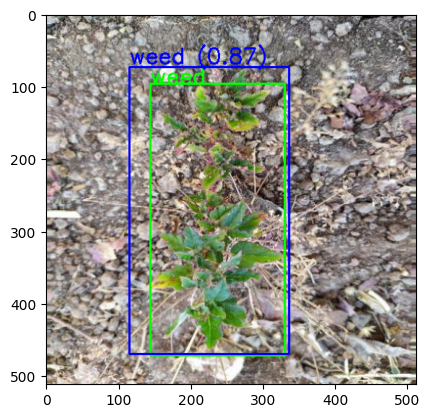

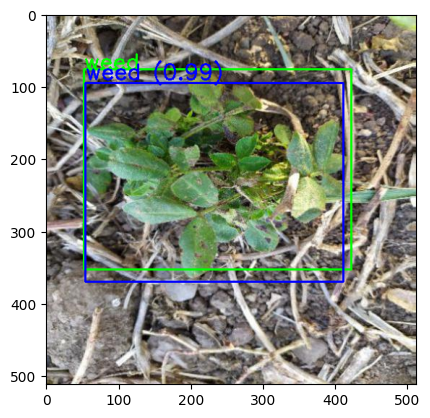

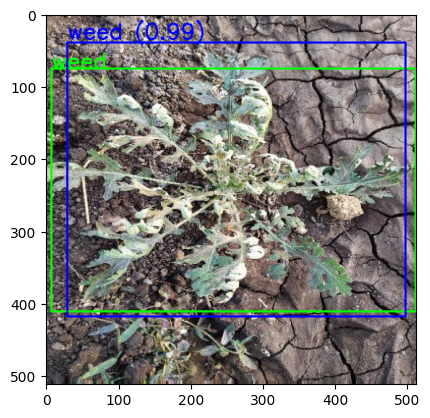

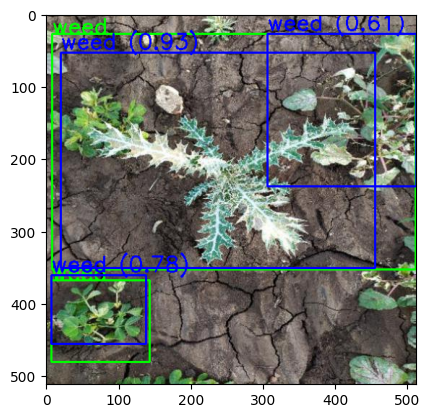

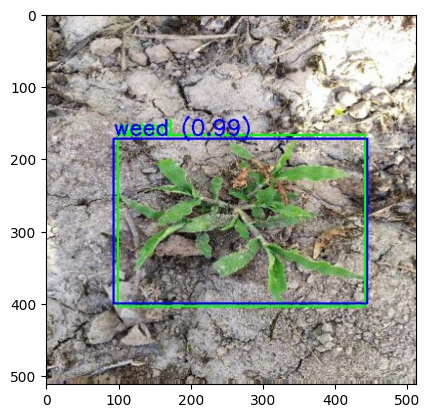

...

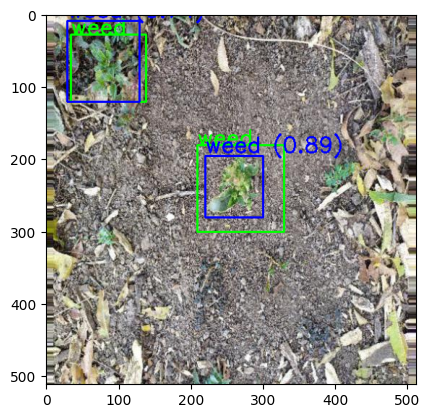

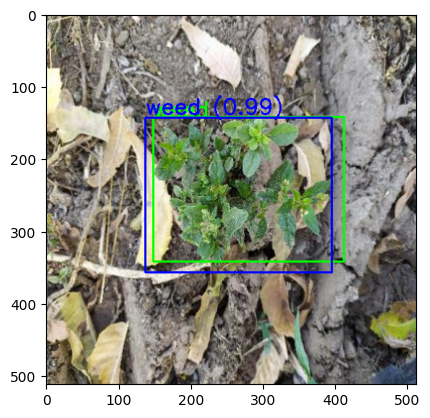

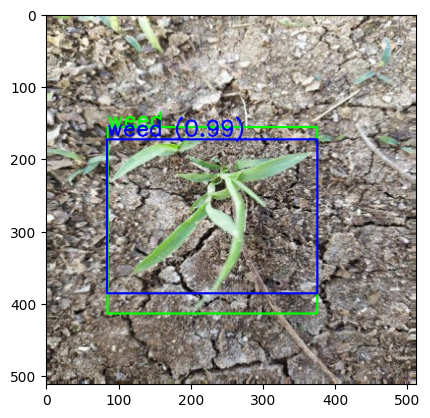

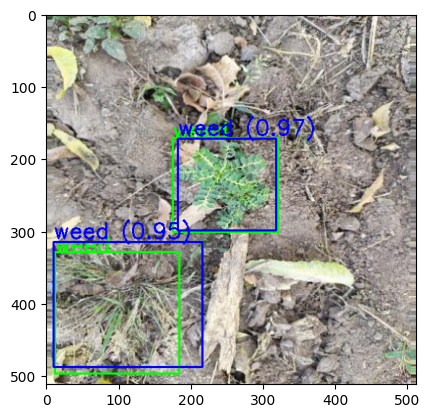

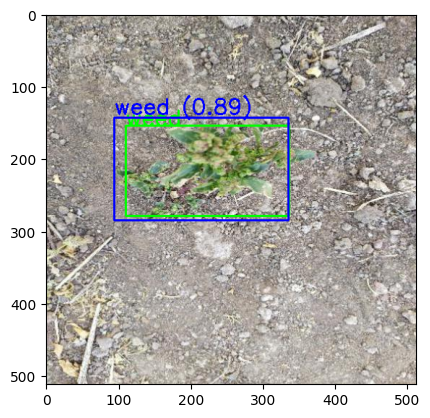

In [16]:
model_ssd.eval().to(device)

print(f"Plotting images: Ground truth bboxes are in green.")

# Randomly pick an image from eval set
for images, targets in test_set:
    for j, img_tensor in enumerate(images):
        img_tensor = img_tensor.to(device)
        img_target = targets[j]
        prediction = model_ssd([img_tensor])[0]

        # Convert tensor to numpy array and reshape for OpenCV and Matplotlib
        img_numpy = (img_tensor.cpu().numpy() * 255).astype(np.uint8).transpose(1, 2, 0)

        # Convert color space if needed (OpenCV uses BGR by default)
        img_bgr = cv2.cvtColor(img_numpy, cv2.COLOR_RGB2BGR)

        # Plot with Matplotlib using OpenCV image
        plt.figure()

        for i, gt_box in enumerate(img_target['boxes'].numpy()):
            gt_label = img_target['labels'].numpy()[i]
            xmin, ymin, xmax, ymax = gt_box
            cv2.rectangle(img_bgr, (int(xmin), int(ymin)), (int(xmax), int(ymax)), (0, 255, 0), 2)
            cv2.putText(img_bgr, str(f"{'crop' if gt_label.item() == 1 else 'weed'}"), (int(xmin), int(ymin)), cv2.FONT_HERSHEY_SIMPLEX, 1,
                        (0, 255, 0), 2)

        boxes = prediction['boxes']
        labels = prediction['labels']
        scores = prediction['scores']

        # filter bbox with confidence = 0.5
        valid_indices = scores > 0.5
        valid_boxes = boxes[valid_indices]
        valid_labels = labels[valid_indices]
        valid_scores = scores[valid_indices]
        for box, label, score in zip(valid_boxes, valid_labels, valid_scores):
            xmin, ymin, xmax, ymax = box

             # Draw bounding box
            cv2.rectangle(img_bgr, (int(xmin), int(ymin)), (int(xmax), int(ymax)), (255, 0, 0), 2)
            
            # Add label and score to the bounding box

            label_text = f"{'crop' if label.item() == 1 else 'weed'} ({score.item():.2f})"
            
            cv2.putText(img_bgr, label_text, (int(xmin), int(ymin) - 5), cv2.FONT_HERSHEY_SIMPLEX, 1,
                        (255, 0, 0), 2)

                    
        

        plt.imshow(cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB))
        plt.show()
    break

## 3. YOLO 11-LARGE

In [17]:
import os
import random
import shutil

# Path to folders
dataset_path = "CropAndWeed_Dataset/agri_data/data/"


target_images_path = os.path.join('dataset_cw/', "images")
target_labels_path = os.path.join('dataset_cw/', "labels")


# Create folders for train and test
for split in ['train', 'test']:
    os.makedirs(os.path.join(target_images_path, split), exist_ok=True)
    os.makedirs(os.path.join(target_labels_path, split), exist_ok=True)

# Getting a list of images and shuffling them
image_files = [f for f in os.listdir(dataset_path) if f.endswith('.jpeg')]
random.shuffle(image_files)

# Determining the train/test boundary
train_size = int(0.8 * len(image_files))
train_files = image_files[:train_size]
test_files = image_files[train_size:]

# Function for moving files
def move_files(files, split, target_images_path, target_labels_path):
    for file in files:
        # Replace images
        shutil.move(os.path.join(dataset_path, file), os.path.join(target_images_path, split, file))
        
        # Replace labels
        label_file = file.replace('.jpeg', '.txt')
        shutil.move(os.path.join(dataset_path, label_file), os.path.join(target_labels_path, split, label_file))


move_files(train_files, 'train', target_images_path, target_labels_path)
move_files(test_files, 'test', target_images_path, target_labels_path)

In [18]:
%pip install ultralytics
import ultralytics
ultralytics.checks()

Ultralytics 8.3.29  Python-3.11.8 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce RTX 4090, 24564MiB)
Setup complete  (24 CPUs, 39.8 GB RAM, 567.1/930.6 GB disk)


In [19]:
folder_data_path = '/Users/Shox/dataset_cw/images/'

# Create data.yaml

data_yaml = f"""
train: {os.path.join(folder_data_path,'train/')}  # Path to training images
test: {os.path.join(folder_data_path, "test/")} # Path to tet images  
val: {os.path.join(folder_data_path, "test/")}
nc: 2                       # Number of classes
names: ['crop', 'weed']     # Class names
"""

with open('data.yaml', 'w') as f:
    f.write(data_yaml)

In [21]:
from ultralytics import YOLO

model = YOLO('yolo11l.pt')  # load a pretrained YOLO detection model
model.train(data='data.yaml', epochs=50, imgsz=512, device=0, optimizer="SGD", lr0=0.0005, lrf=0.0005, 
            momentum=0.9, weight_decay=0.0005, patience=3 ) # train the model

100%|██████████| 49.0M/49.0M [00:04<00:00, 11.5MB/s]


New https://pypi.org/project/ultralytics/8.3.32 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.29  Python-3.11.8 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce RTX 4090, 24564MiB)
engine\trainer: task=detect, mode=train, model=yolo11l.pt, data=data.yaml, epochs=50, time=None, patience=3, batch=16, imgsz=512, save=True, save_period=-1, cache=False, device=0, workers=8, project=None, name=train17, exist_ok=False, pretrained=True, optimizer=SGD, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, sa

100%|██████████| 5.35M/5.35M [00:00<00:00, 7.40MB/s]


AMP: checks passed 


train: Scanning C:\Users\Shox\dataset_cw\labels\train... 1040 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1040/1040 [00:00<00:00, 3083.10it/s]


train: New cache created: C:\Users\Shox\dataset_cw\labels\train.cache


val: Scanning C:\Users\Shox\dataset_cw\labels\test... 260 images, 0 backgrounds, 0 corrupt: 100%|██████████| 260/260 [00:00<00:00, 1830.98it/s]

val: New cache created: C:\Users\Shox\dataset_cw\labels\test.cache


Plotting labels to runs\detect\train17\labels.jpg... 
optimizer: SGD(lr=0.0005, momentum=0.9) with parameter groups 167 weight(decay=0.0), 174 weight(decay=0.0005), 173 bias(decay=0.0)
Image sizes 512 train, 512 val
Using 8 dataloader workers
Logging results to runs\detect\train17
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      7.21G      1.679      2.919      2.014         43        512: 100%|██████████| 65/65 [00:08<00:00,  7.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  8.01it/s]


                   all        260        445      0.437       0.34      0.285      0.181

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      7.27G      1.501      2.204      1.838         56        512: 100%|██████████| 65/65 [00:07<00:00,  8.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  8.44it/s]

                   all        260        445      0.516      0.506      0.533      0.323



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      7.28G      1.369      1.667      1.724         50        512: 100%|██████████| 65/65 [00:07<00:00,  8.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  8.62it/s]

                   all        260        445       0.71      0.687      0.753      0.459



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      7.29G      1.232      1.368      1.573         36        512: 100%|██████████| 65/65 [00:07<00:00,  9.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  8.94it/s]

                   all        260        445      0.769      0.747      0.819      0.524



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      7.33G      1.176      1.253      1.527         42        512: 100%|██████████| 65/65 [00:07<00:00,  9.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:00<00:00,  9.30it/s]

                   all        260        445      0.793      0.791      0.829      0.536



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      7.34G      1.126      1.131      1.491         53        512: 100%|██████████| 65/65 [00:07<00:00,  9.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  8.95it/s]

                   all        260        445      0.817      0.802      0.863      0.581



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      7.34G      1.107      1.049      1.468         49        512: 100%|██████████| 65/65 [00:07<00:00,  9.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:00<00:00,  9.35it/s]

                   all        260        445      0.865      0.759      0.879      0.587



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      7.28G      1.127      1.034      1.454         53        512: 100%|██████████| 65/65 [00:07<00:00,  9.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  8.70it/s]

                   all        260        445      0.838      0.811      0.878      0.592



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      7.35G       1.11     0.9837      1.452         58        512: 100%|██████████| 65/65 [00:07<00:00,  9.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:00<00:00,  9.28it/s]

                   all        260        445      0.825      0.839      0.884      0.598



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      7.32G      1.086     0.9529      1.431         45        512: 100%|██████████| 65/65 [00:07<00:00,  9.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:00<00:00,  9.41it/s]

                   all        260        445      0.821      0.831      0.887      0.608



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      7.34G      1.066     0.9204      1.413         60        512: 100%|██████████| 65/65 [00:07<00:00,  9.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:00<00:00,  9.07it/s]

                   all        260        445       0.86      0.823      0.887      0.612



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      7.29G       1.08     0.9195      1.418         56        512: 100%|██████████| 65/65 [00:07<00:00,  8.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  8.15it/s]

                   all        260        445      0.816      0.848      0.879      0.603



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      7.33G      1.066     0.8809      1.432         75        512: 100%|██████████| 65/65 [00:07<00:00,  9.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:00<00:00,  9.37it/s]

                   all        260        445      0.856      0.822      0.887      0.605



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      7.34G      1.042      0.862      1.404         47        512: 100%|██████████| 65/65 [00:07<00:00,  8.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:00<00:00,  9.26it/s]

                   all        260        445      0.841      0.843      0.884      0.604
EarlyStopping: Training stopped early as no improvement observed in last 3 epochs. Best results observed at epoch 11, best model saved as best.pt.
To update EarlyStopping(patience=3) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.



14 epochs completed in 0.035 hours.
Optimizer stripped from runs\detect\train17\weights\last.pt, 51.2MB
Optimizer stripped from runs\detect\train17\weights\best.pt, 51.2MB

Validating runs\detect\train17\weights\best.pt...
Ultralytics 8.3.29  Python-3.11.8 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce RTX 4090, 24564MiB)
YOLO11l summary (fused): 464 layers, 25,280,854 parameters, 0 gradients, 86.6 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  7.50it/s]


                   all        260        445      0.861      0.823      0.887      0.612
                  crop        134        290      0.811      0.807       0.88      0.608
                  weed        127        155      0.911      0.839      0.894      0.616
Speed: 0.1ms preprocess, 1.5ms inference, 0.0ms loss, 0.7ms postprocess per image
Results saved to runs\detect\train17


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x0000021B5109F0D0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.0

In [22]:
model = YOLO("/Users/Shox/runs/detect/train17/weights/best.pt")  # load a custom model with best weights

# Validate the model
metrics = model.val()  # no arguments needed, dataset and settings remembered
metrics.box.map  # map50-95
metrics.box.map50  # map50
metrics.box.map75  # map75
metrics.box.maps  # a list contains map50-95 of each category

Ultralytics 8.3.29  Python-3.11.8 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce RTX 4090, 24564MiB)
YOLO11l summary (fused): 464 layers, 25,280,854 parameters, 0 gradients, 86.6 GFLOPs


val: Scanning C:\Users\Shox\dataset_cw\labels\test.cache... 260 images, 0 backgrounds, 0 corrupt: 100%|██████████| 260/260 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:01<00:00,  9.77it/s]


                   all        260        445      0.859      0.823      0.887      0.612
                  crop        134        290      0.808      0.807      0.879      0.607
                  weed        127        155       0.91      0.839      0.895      0.616
Speed: 0.2ms preprocess, 3.7ms inference, 0.0ms loss, 0.7ms postprocess per image
Results saved to runs\detect\val4


array([    0.60716,      0.6159])

In [23]:
print(metrics.box.map)  # mAP50-95
print(metrics.box.map50)  # mAP50
print(metrics.box.map75)  # mAP75
print(metrics.box.maps) # list of mAP50-95 for each category

0.6115284292293456
0.8871036916203908
0.6963809220646874
[    0.60716      0.6159]


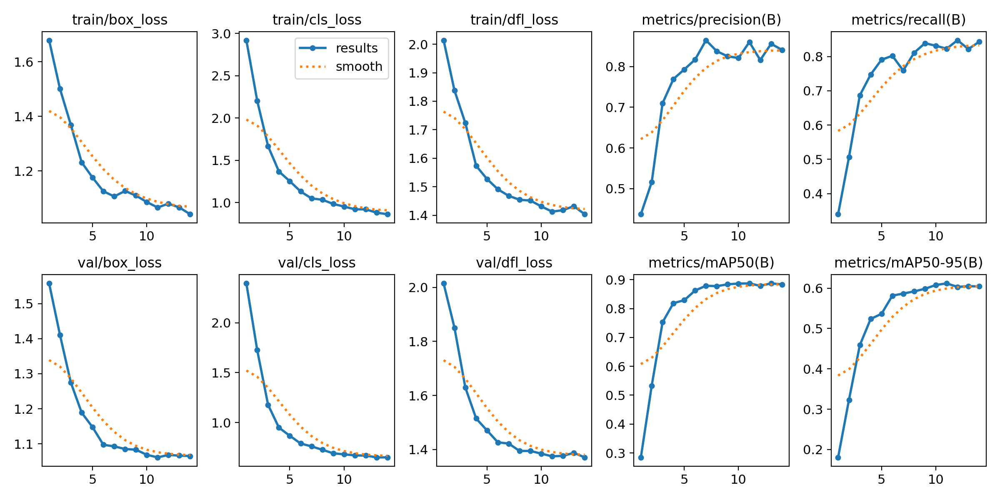

In [24]:
from IPython.display import Image, display

Image(filename = f'/Users/Shox/runs/detect/train17/results.png', width=850)

#### We see that the model at the core increased the mAP metrics with an increase in the number of epochs

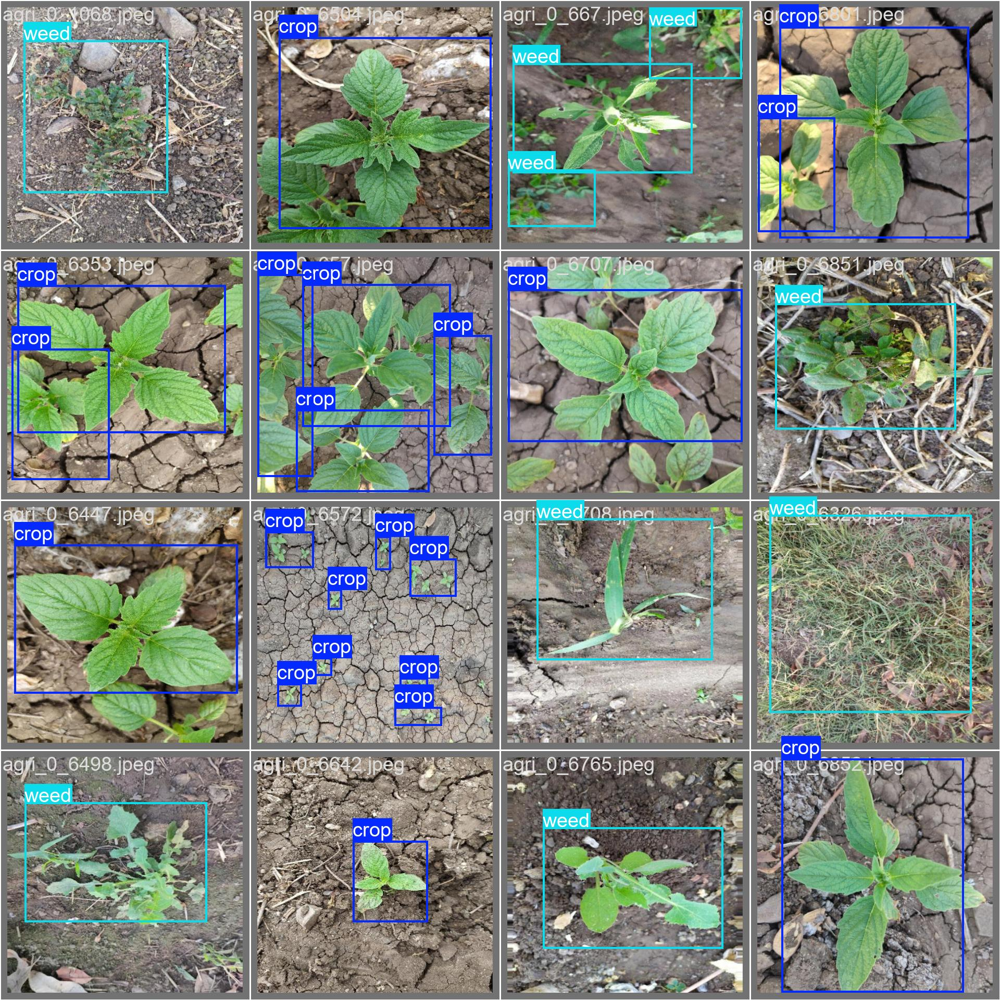

In [25]:
Image(filename = f'/Users/Shox/runs/detect/val4/val_batch0_labels.jpg', width=850)

### Result

In [26]:
map_models['yolo11l'] = metrics.box.map50

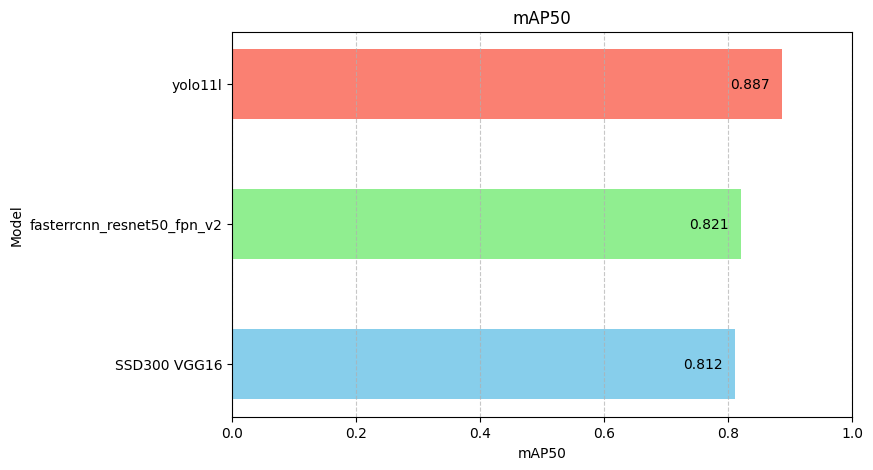

In [35]:
%matplotlib inline
# Extracting mAP models and values
sorted_map_models = dict(sorted(map_models.items(), key=lambda x: x[1]))

models = list(sorted_map_models.keys())
mAP_values = list(sorted_map_models.values())

colors = ['skyblue', 'lightgreen', 'salmon']

# Create a horizontal bar plot
plt.figure(figsize=(8, 5))
bars = plt.barh(models, mAP_values, color=colors, height=0.5) 
plt.ylabel('Model')
plt.xlabel('mAP50')
plt.title('mAP50')
plt.xlim(0, 1)  
plt.grid(axis='x', linestyle='--', alpha=0.7)

# Add mAP values to the bars, rounded to 3 decimal places
for bar in bars:
    plt.text(bar.get_width() - 0.02, bar.get_y() + bar.get_height() / 2,
             f'{bar.get_width():.3f}', va='center', ha='right', color='black')

plt.show()

### As a result, the yolo11l model showed the best quality in terms of the mAP50 metric among the models used in this work with similar hyperparameters, as well as the shortest training time - 11 epochs and 2.1 minutes.